## Business Case Analysis:

Identify which customers will make a specific transaction in the future, irrespective of the amount of money transacted. The data provided has the same structure as the real data to solve this problem.

## Domain Analysis

The features are in private names so we can't do domain analysis

## Dataset description:

There are 202 columns with 200 columns having values for var_1 to var_200 (all are in numeric), one column for ID code and one column for target.
0 Represent -- CUSTOMER DID NOT DO A TRANSACTION
1 Represent -- CUSTOMER DID DO THE TRANSACTION

## Import Libraries and Load the Dataset

In [40]:
import warnings
warnings.filterwarnings('ignore')

# data import & pre-processing
import numpy as np 
import pandas as pd

# data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# machine learning algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC 
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.neural_network import MLPClassifier


# cross validation
from sklearn.model_selection import cross_val_score

# Model evaluation metrics

from sklearn.metrics import accuracy_score,f1_score,classification_report,roc_auc_score,log_loss,precision_score,recall_score


In [2]:
df=pd.read_csv('train(1).csv')

In [ ]:
pd.set_option('display.max_columns',None)

In [4]:
pd.set_option('display.max_rows',None)

## EDA(Exploratory Data Analysis)

#### Basic checks

In [3]:
df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


In [6]:
df.tail()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
199995,train_199995,0,11.4880,-0.4956,8.2622,3.5142,10.3404,11.6081,5.6709,15.1516,-0.6209,5.6669,3.7574,-9.5348,13.9860,5.2982,8.2705,14.1527,7.4540,-5.0105,12.0465,8.6349,9.9137,25.1376,1.0914,3.2326,7.7802,13.9939,2.9085,0.1005,4.2369,7.5665,-9.2149,9.5746,1.4012,7.4211,11.0075,7.8080,4.5567,4.9861,9.7471,0.0722,5.9053,8.1743,10.8800,11.1665,4.2600,-2.1296,8.7833,-15.5727,-8.4916,22.1905,12.4110,15.1168,1.6041,6.1868,10.9576,18.7371,15.2986,5.7322,5.1244,9.8225,14.0315,-23.6064,-1.3403,-2.5577,6.3582,-5.4557,5.6063,7.0054,5.0171,-5.0055,28.9502,1.2297,4.4918,19.5568,20.8357,19.2136,17.6422,17.9836,4.0395,14.0761,-5.7878,16.3870,-14.1721,-13.0269,-2.5955,21.4526,15.6163,0.9845,8.2110,-0.8553,-12.1682,6.7779,7.3895,10.5084,15.5057,-0.6812,5.8999,6.1825,3.1038,-1.6930,-18.8473,9.9358,25.3359,1.3647,11.8509,5.0357,6.4630,18.4008,14.3787,19.0369,-0.6364,6.9155,3.6763,3.1460,4.9442,-1.8289,1.3521,34.6265,-0.6869,-5.3781,20.5030,10.9614,4.9677,6.1408,2.2575,12.8757,14.2253,-1.2868,0.2212,16.8661,12.7663,1.2414,7.1304,7.4108,-6.3369,3.0760,24.9796,20.3410,5.3312,23.7116,2.4745,11.2013,17.8165,13.0057,9.5506,5.3589,13.2491,-3.3068,3.6998,2.5927,14.3025,8.1596,7.9609,18.3343,4.3086,1.3546,12.4158,-5.3985,16.3683,10.4522,35.4923,5.5477,7.4244,12.5459,-6.7840,31.1895,2.6529,-11.1867,9.8865,5.4730,-5.3880,-0.4698,24.4025,-5.4493,11.3529,7.7075,-5.0491,13.0756,15.8271,3.3580,-14.3371,10.4421,7.6530,9.4585,22.7783,-4.0305,4.2233,-6.3906,13.5058,-0.4594,6.1415,13.2305,3.9901,0.9388,18.0249,-1.7939,2.1661,8.5326,16.6660,-17.8661
199996,train_199996,0,4.9149,-2.4484,16.7052,6.6345,8.3096,-10.5628,5.8802,21.5940,-3.6797,6.0019,6.5576,-11.8776,14.4131,3.3087,3.5800,14.1597,7.5191,-8.8715,17.9467,17.0237,6.6459,18.2345,0.8982,2.2532,15.4977,13.3282,5.2281,-3.7424,5.5144,5.7148,-13.7470,7.4369,1.3041,12.7552,12.5362,-1.1002,2.4370,6.2631,14.8565,-2.9862,-7.8820,7.1320,11.8869,11.4218,8.9282,-27.2007,14.5962,-19.8502,26.0775,24.3915,12.6910,10.2453,6.8173,4.5666,-9.5685,18.4685,16.9534,7.3660,4.7038,9.4559,6.0037,-10.8728,0.7859,4.7000,7.8077,-1.7926,6.1534,12.9087,5.0398,-0.4247,22.6256,0.7166,0.6533,13.5821,20.3267,25.5380,14.0155,17.3326,4.2046,14.0195,11.4812,17.9954,-18.3549,-3.4537,1.1233,22.3135,1.9795,16.0239,4.7492,0.2446,-39.6406,6.9473,9.9392,11.1977,14.1006,-0.8012,18.8214,32.9827,1.7989,-0.2476,-15.5294,9.5501,11.8548,1.5127,11.3998,4.2304,6.6777,11.3434,14.2993,13.1205,13.3224,7.3143,3.6817,9.7780,4.0491,2.7221,4.4344,3.7648,2.1927,-2.9197,23.0679,12.2112,

In [4]:
df.shape

(200000, 202)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


In [9]:
df.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,2000

#### Distribution of target variable

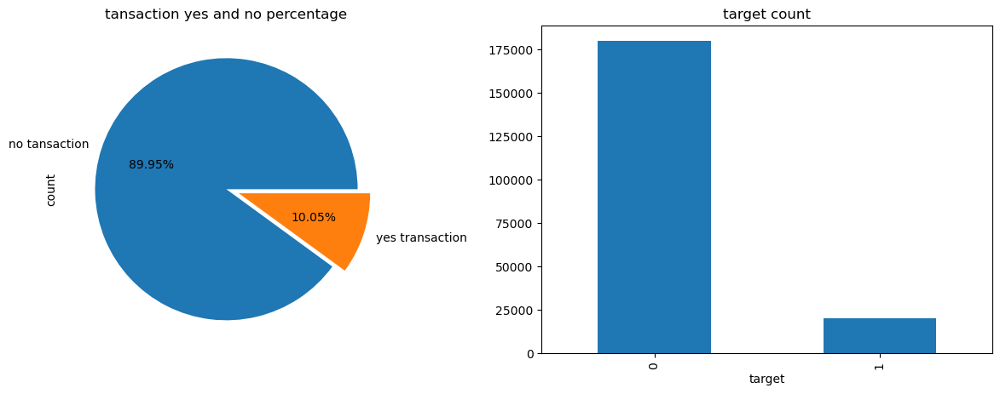

In [12]:
# Plotting attrition of target variable
fig, ax =plt.subplots(ncols=2, figsize=(15, 5))

df.target.value_counts().plot.pie(autopct = "%0.2f%%",explode = [0,0.1], labels=['no tansaction','yes transaction'],ax=ax[0])
ax[0].set_title('tansaction yes and no percentage')

df.target.value_counts().plot(kind='bar',ax=ax[1])
plt.title('target count',loc='center')


plt.show()

From above plot we are clearly seen the 90% customer are did not do a transaction and 10% customer are did do the transaction
This target feature is imbalance so we need to balance the data with the help of oversampling.

#### Univariant and bi-variant analysis

We won't do any uni or bi-variant analysis because of feature names are not provided.

#### Checking the distribution of features

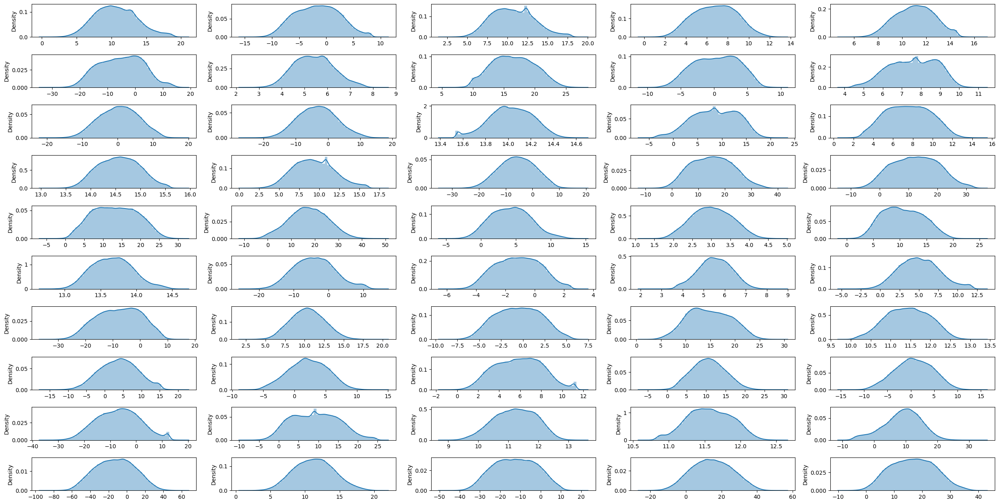

In [15]:
# first 50 features distribution
dist = df.iloc[:,2:52]
plt.figure(figsize=(25,25))
plotnumber = 1
for i in dist:
    plt.subplot(20, 5, plotnumber)
    sns.distplot(x = dist[i],kde = True)
    plotnumber = plotnumber+1
plt.tight_layout()

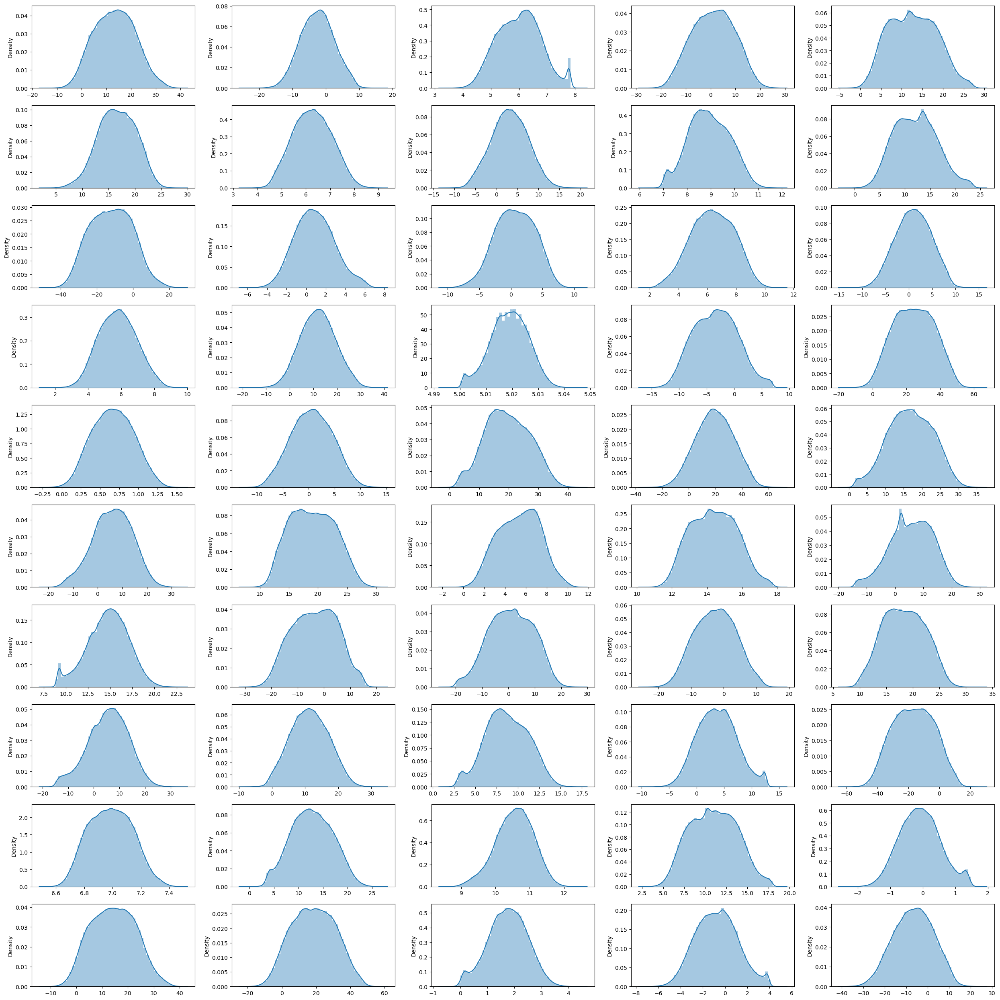

In [17]:
# next 50 features distribution
dist1 = df.iloc[:,53:103]
plt.figure(figsize=(25,25))
plotnumber = 1
for i in dist1:
    plt.subplot(10, 5, plotnumber)
    sns.distplot(x = dist1[i],kde = True)
    plotnumber = plotnumber+1
plt.tight_layout()

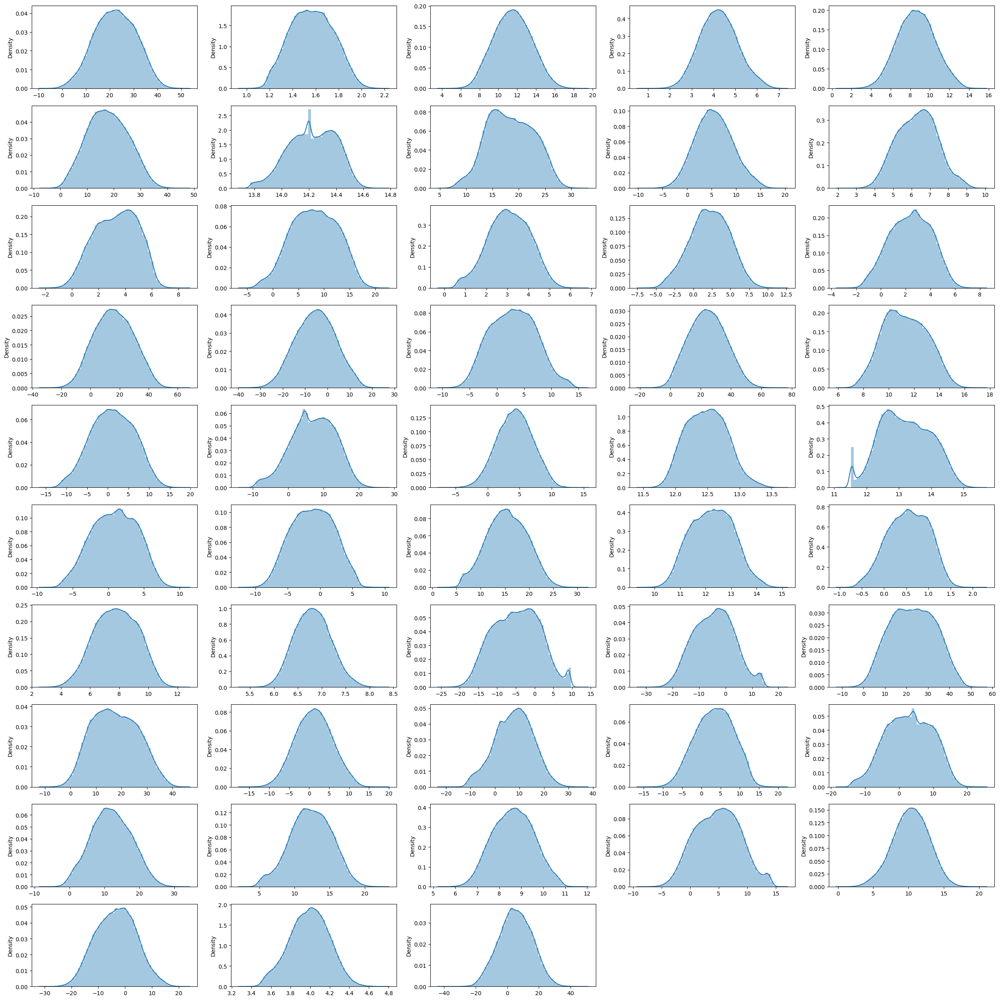

In [18]:
# next 50 features distribution
dist2 = df.iloc[:,104:152]
plt.figure(figsize=(25,25))
plotnumber = 1
for i in dist2:
    plt.subplot(10, 5, plotnumber)
    sns.distplot(x = dist2[i],kde = True)
    plotnumber = plotnumber+1
plt.tight_layout()

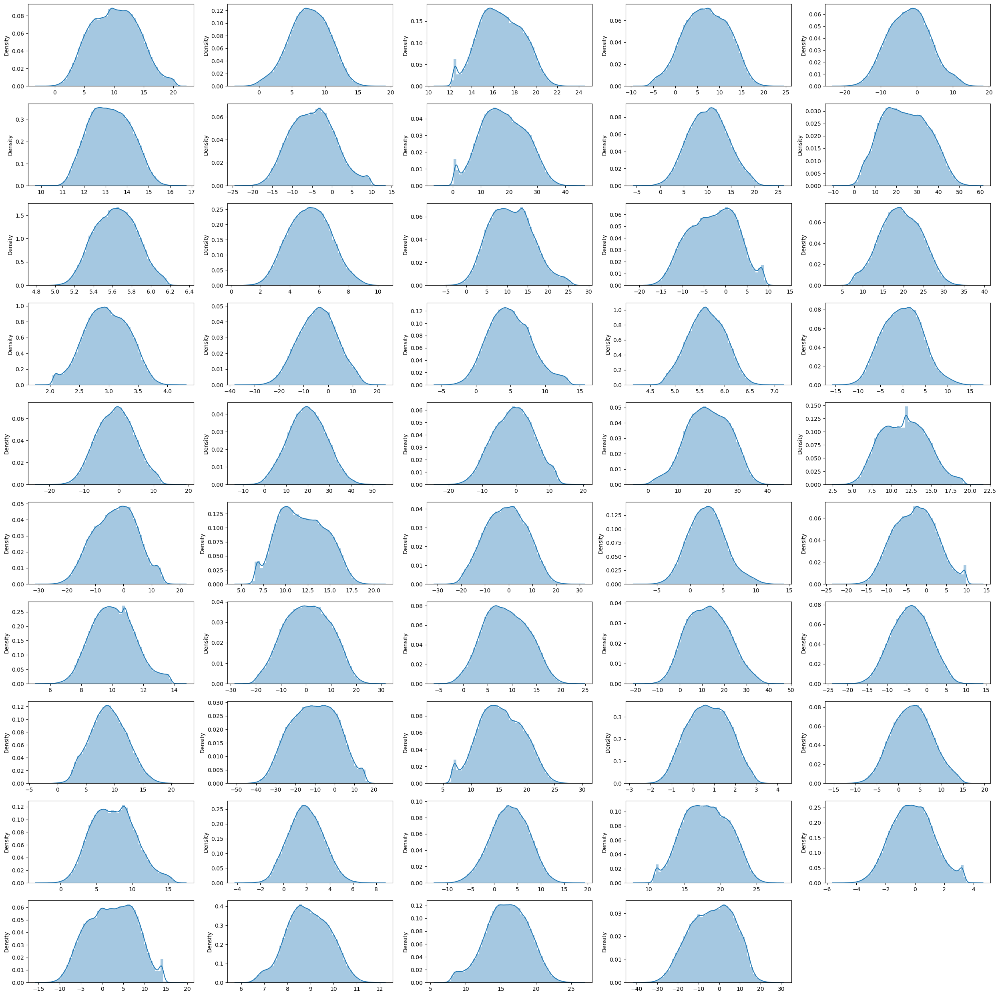

In [19]:
# next 50 features distribution
dist3 = df.iloc[:,153:]
plt.figure(figsize=(25,25))
plotnumber = 1
for i in dist3:
    plt.subplot(10, 5, plotnumber)
    sns.distplot(x = dist3[i],kde = True)
    plotnumber = plotnumber+1
plt.tight_layout()

From above all plots we are clearly see that most of the feature is follow a normal distribution and some feature are very close to the noramal distribution so, we are not using any feature transformation technique.

#### STATISTICAL ANALYSIS

#### Disribution of mean of the data

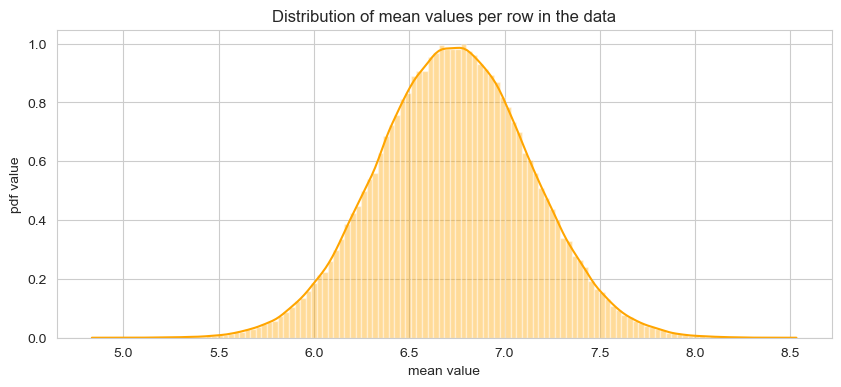

In [10]:
plt.figure(figsize=(10,4))
sns.set_style('whitegrid')
features = df.columns.values[1:202]
plt.title('Distribution of mean values per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(df[features].mean(axis=1),color='ORANGE', kde=True,bins=120)
plt.show()

From the above graph looks like guassian distribution with mean value 6.75 and 80% feature mean lies between 6.5 to 7.0

#### Distribution of standard deviation of the data

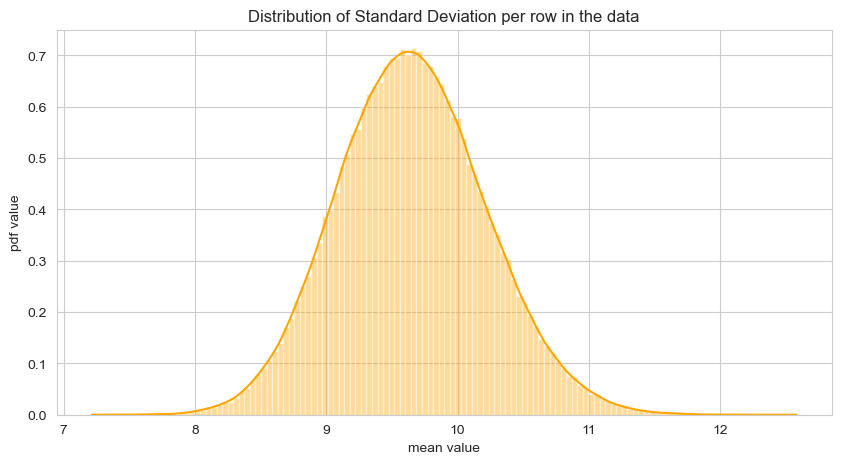

In [11]:
plt.figure(figsize=(10,5))
sns.set_style('whitegrid')
features = df.columns.values[1:202]
plt.title('Distribution of Standard Deviation per row in the data')
plt.xlabel('mean value')
plt.ylabel('pdf value')
sns.distplot(df[features].std(axis=1),color='ORANGE', kde=True,bins=120)
plt.show()

This graph also look like guassian distribution around 60% of feature standard deviation around the range of 9 to 10

## DATA PREPROCESSING

#### Handling with null values

In [3]:
pd.set_option('display.max_rows',None)

In [22]:
df.isnull().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
var_3      0
var_4      0
var_5      0
var_6      0
var_7      0
var_8      0
var_9      0
var_10     0
var_11     0
var_12     0
var_13     0
var_14     0
var_15     0
var_16     0
var_17     0
var_18     0
var_19     0
var_20     0
var_21     0
var_22     0
var_23     0
var_24     0
var_25     0
var_26     0
var_27     0
var_28     0
var_29     0
var_30     0
var_31     0
var_32     0
var_33     0
var_34     0
var_35     0
var_36     0
var_37     0
var_38     0
var_39     0
var_40     0
var_41     0
var_42     0
var_43     0
var_44     0
var_45     0
var_46     0
var_47     0
var_48     0
var_49     0
var_50     0
var_51     0
var_52     0
var_53     0
var_54     0
var_55     0
var_56     0
var_57     0
var_58     0
var_59     0
var_60     0
var_61     0
var_62     0
var_63     0
var_64     0
var_65     0
var_66     0
var_67     0
var_68     0
var_69     0
var_70     0
var_71     0
var_72     0
var_73     0
var_74     0

In [21]:
null=df.isnull().sum()
perc=df.isnull().sum()/df.shape[0]*100
null_perc=pd.concat([null,perc],axis=1,keys=['Missing Number','Missing Percentage'])
null_perc

,Missing Number,Missing Percentage
ID_code,0,0.0
target,0,0.0
var_0,0,0.0
var_1,0,0.0
var_2,0,0.0
var_3,0,0.0
var_4,0,0.0
var_5,0,0.0
var_6,0,0.0
var_7,0,0.0


There is no missing values

In [44]:
df.duplicated().sum()

0

#### Handling Outliers
From the above EDA we seen the feature are very close to the normal distribution as well as distance between point is very less so we are not impute any outlier treatment for this we are use scaling to robust the outlier

#### Feature Scalling
Here we are use robust scaling because the data set contain the outlier but feature is follow a normal distribution.
Robust scaler is similar to normalization but it insted uses the interquatile range, so that is robust to outlier.

In [3]:
from sklearn.preprocessing import RobustScaler # Import library
scaler = RobustScaler() # Object creation
df[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7','var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199',]] = scaler.fit_transform(df[['var_0','var_1','var_2','var_3','var_4','var_5','var_6','var_7',
      'var_8','var_9','var_10','var_11','var_12','var_13',
      'var_14','var_15','var_16','var_17','var_18','var_19','var_20','var_21','var_22','var_23','var_24','var_25','var_26',
      'var_27','var_28','var_29','var_30','var_31','var_32','var_33','var_34','var_35','var_36','var_37','var_38','var_39',
      'var_40','var_41','var_42','var_43','var_44','var_45','var_46','var_47','var_48','var_49','var_50','var_51','var_52',
      'var_53','var_54','var_55','var_56','var_57','var_58','var_59','var_60','var_61','var_62','var_63','var_64','var_65',
      'var_66','var_67','var_68','var_69','var_70','var_71','var_72','var_73','var_74','var_75','var_76','var_77','var_78',
      'var_79','var_80','var_81','var_82','var_83','var_84','var_85','var_86','var_87','var_88','var_89','var_90','var_91',
      'var_92','var_93','var_94','var_95','var_96','var_97','var_98','var_99','var_100','var_101','var_102','var_103',
      'var_104','var_105','var_106','var_107','var_108','var_109','var_110','var_111','var_112','var_113','var_114',
      'var_115','var_116','var_117','var_118','var_119','var_120','var_121','var_122','var_123','var_124','var_125',
      'var_126','var_127','var_128','var_129','var_130','var_131','var_132','var_133','var_134','var_135','var_136','var_137',
      'var_138','var_139','var_140','var_141','var_142','var_143','var_144','var_145','var_146','var_147','var_148','var_149',
      'var_150','var_151','var_152','var_153','var_154','var_155','var_156','var_157','var_158','var_159','var_160','var_161',
      'var_162','var_163','var_164','var_165','var_166','var_167','var_168','var_169','var_170','var_171','var_172','var_173',
      'var_174','var_175','var_176','var_177','var_178','var_179','var_180','var_181','var_182','var_183','var_184','var_185',
      'var_186','var_187','var_188','var_189','var_190','var_191','var_192','var_193','var_194','var_195','var_196','var_197',
      'var_198','var_199']])

In [6]:
df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,var_9,var_10,var_11,var_12,var_13,var_14,var_15,var_16,var_17,var_18,var_19,var_20,var_21,var_22,var_23,var_24,var_25,var_26,var_27,var_28,var_29,var_30,var_31,var_32,var_33,var_34,var_35,var_36,var_37,var_38,var_39,var_40,var_41,var_42,var_43,var_44,var_45,var_46,var_47,var_48,var_49,var_50,var_51,var_52,var_53,var_54,var_55,var_56,var_57,var_58,var_59,var_60,var_61,var_62,var_63,var_64,var_65,var_66,var_67,var_68,var_69,var_70,var_71,var_72,var_73,var_74,var_75,var_76,var_77,var_78,var_79,var_80,var_81,var_82,var_83,var_84,var_85,var_86,var_87,var_88,var_89,var_90,var_91,var_92,var_93,var_94,var_95,var_96,var_97,var_98,var_99,var_100,var_101,var_102,var_103,var_104,var_105,var_106,var_107,var_108,var_109,var_110,var_111,var_112,var_113,var_114,var_115,var_116,var_117,var_118,var_119,var_120,var_121,var_122,var_123,var_124,var_125,var_126,var_127,var_128,var_129,var_130,var_131,var_132,var_133,var_134,var_135,var_136,var_137,var_138,var_139,var_140,var_141,var_142,var_143,var_144,var_145,var_146,var_147,var_148,var_149,var_150,var_151,var_152,var_153,var_154,var_155,var_156,var_157,var_158,var_159,var_160,var_161,var_162,var_163,var_164,var_165,var_166,var_167,var_168,var_169,var_170,var_171,var_172,var_173,var_174,var_175,var_176,var_177,var_178,var_179,var_180,var_181,var_182,var_183,var_184,var_185,var_186,var_187,var_188,var_189,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,-0.371543,-0.849081,0.350032,-0.564165,0.148216,-0.367026,-0.215656,0.420577,-1.011036,-0.957762,0.305583,0.773493,-0.043671,-1.114937,0.366513,-0.008174,-0.966624,-0.162739,-0.922003,1.501988,-0.287712,-0.087983,-0.412584,-0.697739,0.682295,-0.564694,-0.115641,0.311940,-0.548520,0.288457,0.576435,0.841940,-0.851126,0.348616,-0.299471,0.903673,-0.340591,0.581356,-0.981379,0.548539,0.115367,-0.193612,0.319345,1.040799,0.283599,0.173463,-1.324016,-0.105497,0.088093,-0.953893,0.180010,1.287471,0.258004,-0.771426,-0.161079,0.250831,-1.036505,-0.760518,-0.191132,0.969281,0.663865,0.953312,0.457902,-0.194641,1.045515,1.563864,0.014637,1.021941,-0.811881,-0.235622,-0.152782,-0.260393,0.797759,-0.940584,1.177347,0.171753,-0.770042,0.737181,0.354058,-1.091074,0.705281,-0.322230,0.354930,0.149136,-0.217689,0.526629,0.308423,0.631770,-0.169341,-1.068672,-0.245199,-0.889417,-0.256259,-0.788603,0.905459,0.326678,-0.415107,-0.116685,0.408769,-1.002733,1.191061,-0.009283,0.334864,-0.454611,1.145443,1.539743,0.354209,-0.037369,-0.441993,0.901512,-0.635917,0.267546,0.203524,-1.270972,-0.393360,-0.198976,0.038224,-0.019047,-0.655480,0.678865,-0.479367,-0.576777,-0.040617,-0.724279,-0.020919,-1.020520,0.573672,-0.345920,-0.166804,0.003252,0.448584,-0.285488,0.842093,-0.453821,1.045512,0.653827,0.403910,1.027436,0.252403,0.700201,0.661924,-0.828965,0.881523,-0.262672,0.034931,0.598285,0.337620,-1.233241,0.117986,0.866341,0.477374,0.108810,0.313432,0.015391,0.469908,0.456423,-0.694127,-1.039317,-0.002129,0.226414,-0.496664,-0.995956,-0.852672,-0.757186,1.106464,-0.907538,-0.478894,0.302331,1.120384,-0.275810,-0.750177,-0.992302,0.092748,0.431413,-0.155465,-0.900226,-0.683989,0.481938,-0.202353,-0.210354,-0.745271,-0.529248,0.172926,0.860504,0.965631,1.451151,0.656221,-0.535886,0.399552,-0.106880,0.190533,-0.776912,0.599643,-0.303378,0.118478,-1.112383,0.643194,-0.242223,-0.744683,0.107705
1,train_1,0,0.226713,-0.416363,0.864155,-0.467749,0.527324,0.979489,0.190804,0.014925,0.523831,0.231733,-0.111621,1.356555,-0.005922,-0.026486,-0.597899,-1.428478,1.275230,-1.026186,-0.624927,1.325749,-1.055828,-1.256152,1.040491,0.471547,-0.579970,0.561012,-0.919817,-0.613938,-0.443401,-1.213627,-0.153128,-0.825920,0.449260,0.722049,-0.080039,-0.431143,0.134638,-0.016755,0.042161,0.514962,-0.376309,-0.789331,-1.308709,0.475694,-1.053919,-1.092571,-0.967908,0.772529,1.189818,0.759215,-0.943863,-0.018056,-0.229100,0.596677,-0.746539,0.673046,0.514992,0.647343,-0.207278,-0.026

## Feature selection

##### Checking correlation

In [4]:
df.drop('ID_code',axis=1,inplace=True)

<Axes: >

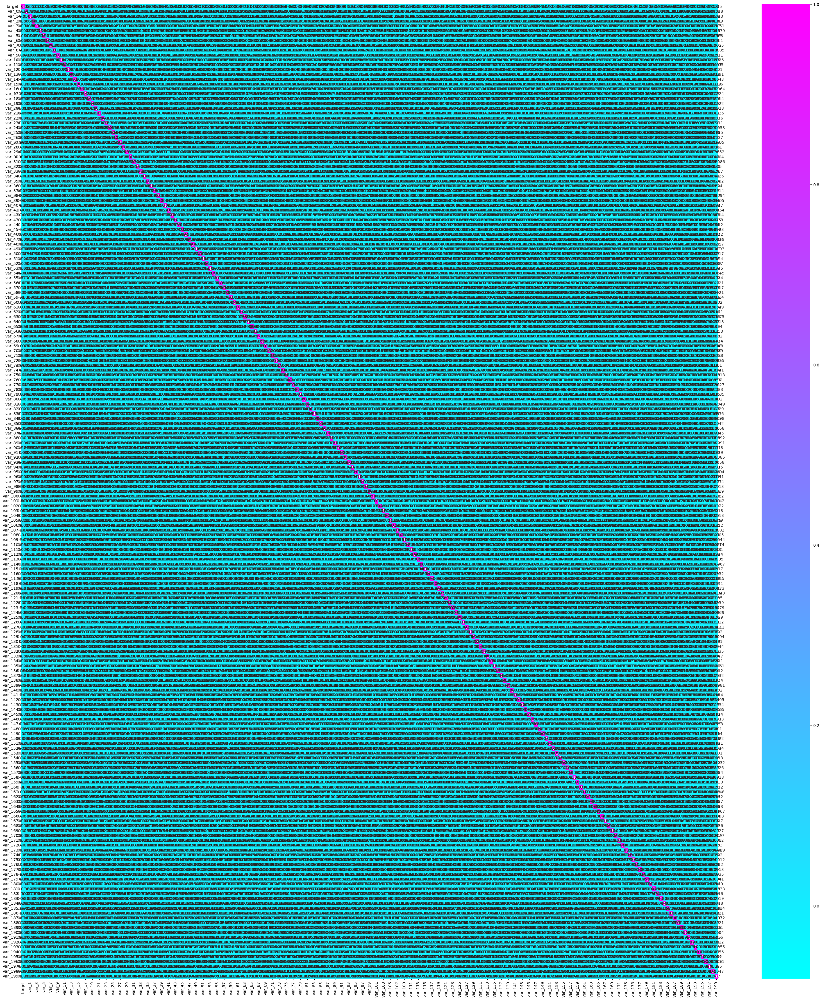

In [6]:
plt.figure(figsize=(40,45))
sns.heatmap(df.corr(),annot=True , cmap='cool')

From above heatmap scale we are clearly seen the their is no highly correlated feature in data

#### PRINCIPLE COMPONENT ANALYSIS(PCA)

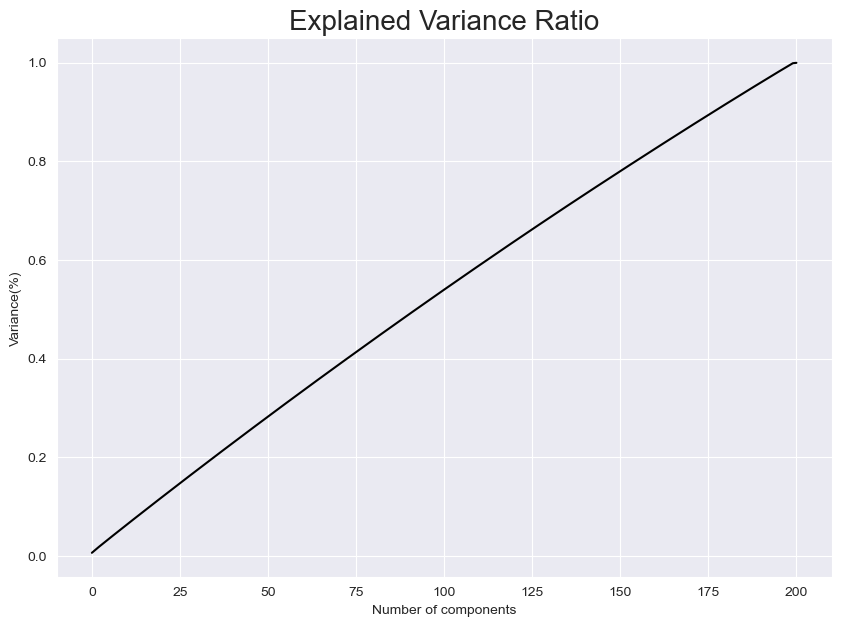

In [5]:
#Step 1: Getting the optimal value of pca
from sklearn.decomposition import PCA

#step 2: # Object creation
pca = PCA() 

#Step 3: Fitting the data
principlecomponent = pca.fit_transform(df)

#Scree plots for the graphs that convey how much variance is explained by corresponding Principal components.
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),color ='k')
plt.xlabel('Number of components',fontsize=10)
plt.ylabel('Variance(%)',fontsize=10) # for each componant
plt.title('Explained Variance Ratio',fontsize=20)
plt.show()

In [6]:
# Selecting the components
pca = PCA(n_components=175)
new_df = pca.fit_transform(df)
new_df

array([[-0.51758867,  0.26955976,  0.05402251, ...,  0.91197506,
         0.02825685, -0.01823824],
       [ 1.32400732, -0.53357927,  1.95817087, ...,  0.11897006,
        -0.04993349, -0.091531  ],
       [-0.04224386, -0.81522866, -0.3257926 , ...,  0.04433698,
        -1.15220835, -0.52020052],
       ...,
       [ 0.01423866,  0.55522966,  0.65142503, ...,  0.13624811,
        -0.40374922,  0.61777042],
       [-0.40689894,  0.23820526,  0.38221209, ..., -0.55847262,
         0.11239184, -0.75789081],
       [-0.76575485, -0.16503883,  0.39951196, ...,  1.09182605,
        -0.47622989,  0.67725346]])

In [7]:
# Create a new dataframe
principle_df = pd.DataFrame(data=new_df,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10',
                            'pca11','pca12','pca13','pca14','pca15','pca16','pca17','pca18','pca19','pca20','pca21','pca22',
                            'pca23','pca24','pca25','pca26','pca27','pca28','pca29','pca30','pca31','pca32','pca33','pca34',
                            'pca35','pca36','pca37','pca38','pca39','pca40','pca41','pca42','pca43','pca44','pca45','pca46',
                            'pca47','pca48','pca49','pca50','pca51','pca52','pca53','pca54','pca55','pca56','pca57','pca58',
                            'pca59','pca60','pca61','pca62','pca63','pca64','pca65','pca66','pca67','pca68','pca69','pca70',
                            'pca71','pca72','pca73','pca74','pca75','pca76','pca77','pca78','pca79','pca80','pca81','pca82',
                            'pca83','pca84','pca85','pca86','pca87','pca88','pca89','pca90','pca91','pca92','pca93','pca94',
                            'pca95','pca96','pca97','pca98','pca99','pca100','pca101','pca102','pca103','pca104','pca105',
                            'pca106','pca107','pca108','pca109','pca110','pca111','pca112','pca113','pca114','pca115','pca116',
                            'pca117','pca118','pca119','pca120','pca121','pca122','pca123','pca124','pca125','pca126','pca127',
                            'pca128','pca129','pca130','pca131','pca132','pca133','pca134','pca135','pca136','pca137','pca138',
                            'pca139','pca140','pca141','pca142','pca143','pca144','pca145','pca146','pca147','pca148','pca149',
                            'pca150','pca151','pca152','pca153','pca154','pca155','pca156','pca157','pca158','pca159','pca160',
                            'pca161','pca162','pca163','pca164','pca165','pca166','pca167','pca168','pca169','pca170',
                            'pca171','pca172','pca173','pca174','pca175'])
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,...,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,-0.517589,0.269560,0.054023,-0.369893,-0.835381,-0.662795,-1.319730,-1.064223,0.849499,0.433281,...,0.554410,-0.611039,-1.112001,0.258308,0.751815,-0.967646,-0.750007,0.911975,0.028257,-0.018238
1,1.324007,-0.533579,1.958171,1.308587,-0.328150,-0.049564,1.179654,-0.139923,-0.443926,0.601061,...,0.807269,0.357139,1.262798,0.132334,-0.126031,-0.782291,0.295756,0.118970,-0.049933,-0.091531
2,-0.042244,-0.815229,-0.325793,0.225673,0.013017,-0.143188,-0.106796,0.226355,0.768914,0.082743,...,-0.571805,0.691044,-0.271241,0.335684,0.558622,-0.601425,-0.833146,0.044337,-1.152208,-0.520201
3,1.384955,0.367701,0.459503,-0.644095,-0.384638,0.117310,1.266890,-0.159772,-0.618706,0.584172,...,-1.503312,0.682461,0.035037,-0.304494,0.194574,0.874634,-0.182145,-0.717708,0.512492,0.430749
4,0.592824,-0.160891,0.584662,-0.840627,0.147873,-0.404153,-0.678792,0.868974,0.354538,-0.451727,...,0.459845,-0.455293,0.147366,-1.475875,-0.264492,-0.164119,-0.102101,-0.239766,-0.584007,-0.161014


## MODEL CREATION

In [8]:
x=principle_df
y= df.target

In [12]:
x.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15,pca16,pca17,pca18,pca19,pca20,pca21,pca22,pca23,pca24,pca25,pca26,pca27,pca28,pca29,pca30,pca31,pca32,pca33,pca34,pca35,pca36,pca37,pca38,pca39,pca40,pca41,pca42,pca43,pca44,pca45,pca46,pca47,pca48,pca49,pca50,pca51,pca52,pca53,pca54,pca55,pca56,pca57,pca58,pca59,pca60,pca61,pca62,pca63,pca64,pca65,pca66,pca67,pca68,pca69,pca70,pca71,pca72,pca73,pca74,pca75,pca76,pca77,pca78,pca79,pca80,pca81,pca82,pca83,pca84,pca85,pca86,pca87,pca88,pca89,pca90,pca91,pca92,pca93,pca94,pca95,pca96,pca97,pca98,pca99,pca100,pca101,pca102,pca103,pca104,pca105,pca106,pca107,pca108,pca109,pca110,pca111,pca112,pca113,pca114,pca115,pca116,pca117,pca118,pca119,pca120,pca121,pca122,pca123,pca124,pca125,pca126,pca127,pca128,pca129,pca130,pca131,pca132,pca133,pca134,pca135,pca136,pca137,pca138,pca139,pca140,pca141,pca142,pca143,pca144,pca145,pca146,pca147,pca148,pca149,pca150,pca151,pca152,pca153,pca154,pca155,pca156,pca157,pca158,pca159,pca160,pca161,pca162,pca163,pca164,pca165,pca166,pca167,pca168,pca169,pca170,pca171,pca172,pca173,pca174,pca175
0,-0.517589,0.269560,0.054023,-0.369893,-0.835381,-0.662795,-1.319730,-1.064223,0.849499,0.433281,-0.099748,0.189458,-0.036275,-0.666101,-0.022342,0.761547,0.166639,-0.030342,0.068087,1.435869,-0.548179,1.059613,-1.190722,0.729638,0.071145,-0.078544,-0.887911,0.807112,-0.012292,-0.763784,-0.274470,-0.372900,0.263387,0.002814,-0.656367,0.047525,-0.682693,-0.054722,-0.088106,-0.400059,-0.216680,-0.921100,0.608908,0.340632,0.704269,-0.170687,-0.654300,1.061424,-0.483177,-1.065057,1.490633,-0.388312,0.253202,0.513145,-1.014501,-0.233567,-0.107051,-0.773744,0.066686,0.477828,-0.881100,0.525298,1.033929,0.201180,-0.691202,0.487673,0.445280,-0.124135,1.776024,0.074610,-0.685690,0.032297,-0.050818,0.034366,-0.397986,1.170827,0.368282,0.595141,-1.006387,-0.382024,0.535029,0.493931,0.756615,-0.714640,0.164489,0.506951,-0.682040,-0.319673,1.048802,-0.270264,-0.624894,0.068417,-0.701790,-0.475613,-0.198829,0.755601,-0.329829,-0.150092,1.165510,-1.094786,-0.607245,-0.807198,-0.182657,0.224932,-1.100740,-0.356435,0.452096,-0.107081,0.001502,-1.180537,0.631718,0.756883,1.088512,-0.304309,0.186437,0.176686,-0.926008,-0.804948,-0.792421,1.048378,0.797376,1.107738,0.291139,-0.053988,-1.002628,0.755661,-0.211778,0.234515,-0.266976,-0.328136,-0.648342,-0.498883,0.522072,0.584286,-0.637994,0.123388,0.333348,1.680633,0.620728,0.031284,0.976753,-0.287220,0.397111,-0.959304,0.769188,-0.401486,-0.294892,-0.331451,-0.103151,1.979216,0.167794,-0.214290,0.403365,-0.544890,0.547660,0.513307,-0.598169,-0.702461,0.554514,-0.282646,-0.129703,-1.053936,-0.667963,0.169669,1.219645,0.554410,-0.611039,-1.112001,0.258308,0.751815,-0.967646,-0.750007,0.911975,0.028257,-0.018238
1,1.324007,-0.533579,1.958171,1.308587,-0.328150,-0.049564,1.179654,-0.139923,-0.443926,0.601061,-0.507448,0.290780,2.031748,1.611884,-0.508465,-0.886412,0.154350,0.436477,0.736805,-0.529373,-1.095882,-0.959536,1.069778,-1.143183,-2.077901,0.579774,1.045354,-0.939488,-0.376925,0.163353,0.055867,-0.105673,-0.970089,-0.221928,0.833694,-1.083230,0.575362,-1.052924,0.173764,0.949257,0.279215,-0.698407,0.107007,-0.484972,-1.349184,0.738426,-0.073452,-0.602862,0.583670,0.220609,-0.306837,0.204201,0.228406,0.633989,0.153384,0.466705,-0.628820,-0.603458,-1.086874,-1.179418,-0.334649,0.610178,-0.116334,0.111064,-0.683004,-1.137632,-0.223746,-0.423983,-0.800753,-0.838010,-0.190419,-0.771438,-0.256354,0.129691,0.351200,-0.497553,-1.241447,-0.499981,-0.798423,-0.622427,0.289117,-0.650573,-0.136576,-0.584297,0.110860,0.206038,-0.438245,-0.541694,0.912810,-0.077358,-0.330347,1.128143,0.679547,0.558082,0.370086,-0.233700,0.451091,0.351500,0.282666,1.002136,-0.024931,-1.136643,0.046010,-0.513514,1.083092,-1.365194,0.171206,-0.028797,0.311181,-0.808733,-0.251169,0.152583,-0.291193,-0.772977,-0.671171,1.461625,0.492782,-0.479170,-0.949655,-0.332061,0.031731,-0.234562,0.318108,-1.348991,-0.399963,-0.732549,-0.580

In [13]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: target, dtype: int64

#### Balancing

In [9]:
from collections import Counter
from imblearn.over_sampling import SMOTE #SMOTE(synthetic minority oversampling techinque)
sm = SMOTE() # obeject creation
print("unbalanced data   :  ",Counter(y))
x_sm,y_sm = sm.fit_resample(x,y)
print("balanced data:    :",Counter(y_sm))


unbalanced data   :   Counter({0: 179902, 1: 20098})
balanced data:    : Counter({0: 179902, 1: 179902})


#### Train Test Split

In [10]:
from sklearn.model_selection import train_test_split

In [11]:
x_train,x_test,y_train,y_test=train_test_split (x_sm, y_sm, test_size=0.20, random_state=18)

In [16]:
## checking distribution of traget variable in train test split
print('Distribution of traget variable in training set')
print(y_train.value_counts())

print('Distribution of traget variable in test set')
print(y_test.value_counts())

Distribution of traget variable in training set
target
1    126009
0    125853
Name: count, dtype: int64
Distribution of traget variable in test set
target
0    54049
1    53893
Name: count, dtype: int64


In [17]:
## training and testing data shape

print('------------Training Set------------------')
print(x_train.shape)
print(y_train.shape)

print('------------Test Set------------------')
print(x_test.shape)
print(y_test.shape)

------------Training Set------------------
(251862, 175)
(251862,)
------------Test Set------------------
(107942, 175)
(107942,)


#### Model Fitting

## 1.Logistic Regression

In [12]:
#Step:1 importing library
from sklearn.linear_model import LogisticRegression

# Step:2 Object creation 
LR = LogisticRegression()

# Step:3 fitting traing data
LR.fit(x_train,y_train)

# Step:4 Prediction on training data
LR_train_pred = LR.predict(x_train)

# Step:5 Prediction on test data
LR_test_pred = LR.predict(x_test)


#### Evaluation of logostic regression

#### Training accuracy of LR

In [13]:
LR_train_accuracy = accuracy_score(LR_train_pred,y_train)
print("Training accuracy of Logistic regression model",LR_train_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(LR_train_pred,y_train))

Training accuracy of Logistic regression model 83.55770333132992
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83    141572
           1       0.84      0.83      0.84    146271

    accuracy                           0.84    287843
   macro avg       0.84      0.84      0.84    287843
weighted avg       0.84      0.84      0.84    287843



#### Testing accuracy of LR

In [14]:
LR_test_accuracy = accuracy_score(LR_test_pred,y_test)
print("testing accuracy of Logistic regression model",LR_test_accuracy*100)
print("Logistic regression training Classification report: \n",classification_report(LR_test_pred,y_test))

testing accuracy of Logistic regression model 83.49661622267617
Logistic regression training Classification report: 
               precision    recall  f1-score   support

           0       0.83      0.84      0.83     35434
           1       0.84      0.83      0.84     36527

    accuracy                           0.83     71961
   macro avg       0.83      0.84      0.83     71961
weighted avg       0.84      0.83      0.83     71961



In [15]:
# In customer transaction prediction f1 score is more important
LR_f1_score = f1_score(LR_test_pred,y_test)
LR_f1_score*100

83.608005521049

#### LR bagging

In [19]:
# Step:1 Create a logictice regression object for bagging
LR1 = LogisticRegression()

# Step:2 importing library
from sklearn.ensemble import BaggingClassifier
LR_bagg = BaggingClassifier(base_estimator=LR1,n_estimators=50)
#base_estimator---> algorithm which you want to pass
#n_estimotors-----> number of base learners

# Step:3 fitting the Training data
LR_bagg.fit(x_train,y_train)

# Step:4 prediction on test data
bagg_pred = LR_bagg.predict(x_test)


In [20]:
# evaluation  bagging of LR
LR_bagg_accuracy = accuracy_score(bagg_pred,y_test)
print("Testing accuracy of Logistic regession model after bagging",LR_bagg_accuracy*100)

Testing accuracy of Logistic regession model after bagging 83.50873617313002


## 2.KNN

In [16]:
# Step:3 Get nearst neighbors
knn = KNeighborsClassifier()

# Step:4 Fitting the training data
knn.fit(x_train,y_train)


# Step:5 Prediction on training data
knn_train_predict = knn.predict(x_train)

# Step:6 Prediction on testing data
knn_test_predict = knn.predict(x_test)

#### Evaluation of KNN

#### Training accuracy of KNN

In [17]:
knn_train_acc=accuracy_score(knn_train_predict,y_train)
print('Training accuracy of KNN',knn_train_acc*100)
print('Training classification report:\n',classification_report(knn_train_predict,y_train))

Training accuracy of KNN 50.04811650795746
Training classification report:
               precision    recall  f1-score   support

           0       0.00      1.00      0.00        81
           1       1.00      0.50      0.67    287762

    accuracy                           0.50    287843
   macro avg       0.50      0.75      0.33    287843
weighted avg       1.00      0.50      0.67    287843



#### Testing accuracy of KNN

In [18]:
knn_test_acc=accuracy_score(knn_test_predict,y_test)
print('Testing accuraco of KNN',knn_test_acc*100)
print('Testing classification report:\n',classification_report(knn_test_predict,y_test))

Testing accuraco of KNN 49.9214852489543
Testing classification report:
               precision    recall  f1-score   support

           0       0.00      1.00      0.00         1
           1       1.00      0.50      0.67     71960

    accuracy                           0.50     71961
   macro avg       0.50      0.75      0.33     71961
weighted avg       1.00      0.50      0.67     71961



In [15]:
# In customer transaction prediction f1 score is more important
knn_f1_score = f1_score(knn_test_predict,y_test)
knn_f1_score*100

66.59621997905138

## 3. GaussianNB (NB)

In [19]:
# Step:1 importing model library
from sklearn.naive_bayes import GaussianNB

# Step:2 Object creation
NB=GaussianNB()

# Step:3 Fitting the training data
NB.fit(x_train,y_train)

# Step:4 Prediction on training data
NB_train_pred=NB.predict(x_train)

# Step:5 Prediction on testing data
NB_test_pred=NB.predict(x_test)

#### Evaluation of NB

#### training accuracy of NB

In [20]:
nb_train_acc=accuracy_score(NB_train_pred,y_train)
print('Training accuracy of NB',nb_train_acc*100)
print('Training classification report:\n',classification_report(NB_train_pred,y_train))

Training accuracy of NB 87.84649965432546
Training classification report:
               precision    recall  f1-score   support

           0       0.95      0.83      0.89    163347
           1       0.81      0.94      0.87    124496

    accuracy                           0.88    287843
   macro avg       0.88      0.89      0.88    287843
weighted avg       0.89      0.88      0.88    287843



#### testing accuracy of NB

In [21]:
nb_test_acc=accuracy_score(NB_test_pred,y_test)
print('Testing accuracy of NB',nb_test_acc*100)
print('Testing classification report:\n',classification_report(NB_test_pred,y_test))

Testing accuracy of NB 88.0324064423785
Testing classification report:
               precision    recall  f1-score   support

           0       0.95      0.84      0.89     40798
           1       0.81      0.94      0.87     31163

    accuracy                           0.88     71961
   macro avg       0.88      0.89      0.88     71961
weighted avg       0.89      0.88      0.88     71961



In [22]:
# In customer transaction prediction f1 score is more important
nb_f1_score = f1_score(NB_test_pred,y_test)
nb_f1_score*100

87.1627463256119

## 4.DecisionTreeClassifier (DT)

In [23]:
# Step:1 importing model library
from sklearn.tree import DecisionTreeClassifier

# Step:2 Object creation
DT=DecisionTreeClassifier()

# Step:3 Fitting the training data
DT.fit(x_train,y_train)

# Step:4 Prediction on training data
DT_train_pred=DT.predict(x_train)

# Step:5 Prediction on testing data
DT_test_pred=DT.predict(x_test)

#### Evaluation of DT

#### Training accuracy of DT

In [24]:
dt_train_acc=accuracy_score(DT_train_pred,y_train)
print('training accuracy of DT',dt_train_acc*100)
print('classification report of DT:\n',classification_report(DT_train_pred,y_train))

training accuracy of DT 100.0
classification report of DT:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00    143864
           1       1.00      1.00      1.00    143979

    accuracy                           1.00    287843
   macro avg       1.00      1.00      1.00    287843
weighted avg       1.00      1.00      1.00    287843



#### testing accuracy of DT

In [25]:
dt_test_acc=accuracy_score(DT_test_pred,y_test)
print('testing accuracy of DT',dt_test_acc*100)
print('classification report of DT:\n',classification_report(DT_test_pred,y_test))

testing accuracy of DT 84.24424340962466
classification report of DT:
               precision    recall  f1-score   support

           0       0.81      0.87      0.84     33800
           1       0.87      0.82      0.85     38161

    accuracy                           0.84     71961
   macro avg       0.84      0.84      0.84     71961
weighted avg       0.84      0.84      0.84     71961



In [26]:
# In customer transaction prediction f1 score is more important
dt_f1_score = f1_score(DT_test_pred,y_test)
dt_f1_score*100

84.6957507693969

## 5.XGBoost(Extreme Gradient Boosting)

In [27]:
# Step:1 import library and object creation
import xgboost
from xgboost import XGBClassifier
XGB = XGBClassifier()

# Step:2 Fitting the training data
XGB.fit(x_train,y_train)

# Step:3 Prediction on training data
xgb_train_pred = XGB.predict(x_train)

# Step:4 Prediction on testing data
xgb_test_pred = XGB.predict(x_test)

#### Evaluation of XGB

#### training accuracy of XGB

In [28]:
xgb_train_acc=accuracy_score(xgb_train_pred,y_train)
print('training accuracy of XGB',xgb_train_acc*100)
print('classification report of XGB:\n',classification_report(xgb_train_pred,y_train))

training accuracy of XGB 93.49332796003377
classification report of XGB:
               precision    recall  f1-score   support

           0       0.93      0.94      0.93    142571
           1       0.94      0.93      0.94    145272

    accuracy                           0.93    287843
   macro avg       0.93      0.93      0.93    287843
weighted avg       0.93      0.93      0.93    287843



#### testing accuracy of XGB

In [29]:
xgb_test_acc=accuracy_score(xgb_test_pred,y_test)
print('testing accuracy of XGB',xgb_test_acc*100)
print('classification report of XGB:\n',classification_report(xgb_test_pred,y_test))

testing accuracy of XGB 90.66438765442393
classification report of XGB:
               precision    recall  f1-score   support

           0       0.90      0.91      0.91     35426
           1       0.92      0.90      0.91     36535

    accuracy                           0.91     71961
   macro avg       0.91      0.91      0.91     71961
weighted avg       0.91      0.91      0.91     71961



In [30]:
# In customer transaction prediction f1 score is more important
xgb_f1_score = f1_score(xgb_test_pred,y_test)
xgb_f1_score*100

90.7284219823898

## 6.MLPClassifier(MLP)

In [31]:
# Step:1 import library
from sklearn.neural_network import MLPClassifier

#Step:2 Object creation
MLP = MLPClassifier()

# Step:3 Fitting the training data
MLP.fit(x_train,y_train)

# Step:4 Prediction on training data
mlp_train_pred = MLP.predict(x_train)

# Step:5 Prediction on testing data
mlp_test_pred = MLP.predict(x_test)

#### Evaluation of MLP

#### training accuracy of MLP

In [32]:
mlp_train_acc=accuracy_score(mlp_train_pred,y_train)
print('training accuracy of MLP',mlp_train_acc*100)
print('classification report of MLP:\n',classification_report(mlp_train_pred,y_train))

training accuracy of MLP 96.08467115754074
classification report of MLP:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96    144862
           1       0.96      0.96      0.96    142981

    accuracy                           0.96    287843
   macro avg       0.96      0.96      0.96    287843
weighted avg       0.96      0.96      0.96    287843



#### Testing accuracy of MLP

In [33]:
mlp_test_acc=accuracy_score(mlp_test_pred,y_test)
print('testing accuracy of MLP',mlp_test_acc*100)
print('classification report of MLP:\n',classification_report(mlp_test_pred,y_test))

testing accuracy of MLP 91.66215033142953
classification report of MLP:
               precision    recall  f1-score   support

           0       0.91      0.92      0.92     35442
           1       0.92      0.91      0.92     36519

    accuracy                           0.92     71961
   macro avg       0.92      0.92      0.92     71961
weighted avg       0.92      0.92      0.92     71961



In [34]:
# In customer transaction prediction f1 score is more important
mlp_f1_score = f1_score(mlp_test_pred,y_test)
mlp_f1_score*100

91.71751194058695

## Model Comparison Report

#### Training Results of all models

In [35]:
train_data = {  'LR': LR_train_pred,
                'KNN':knn_train_predict,
                'DT': DT_train_pred,
                'NB': NB_train_pred,
                'XGB': xgb_train_pred,
                'MLP': mlp_train_pred}

train_models = pd.DataFrame(train_data) 

In [45]:
 ##Initialize an empty DataFrame to hold results

train_model_comparison = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC', 'Log_Loss'])

# Iterate through each model's predictions

for column in train_models:
    
    acc = accuracy_score(y_train, train_models[column])
    prec = precision_score(y_train, train_models[column])
    rec = recall_score(y_train, train_models[column])
    f1 = f1_score(y_train, train_models[column])
    roc = roc_auc_score(y_train, train_models[column])
    loss_log = log_loss(y_train, train_models[column])

    
     # Create a DataFrame for the current model's results
    results = pd.DataFrame([[column, acc, prec, rec, f1, roc, loss_log]],
                           columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC', 'Log_Loss'])
    
     # Append the results to the overall results DataFrame
    train_model_comparison = pd.concat([train_model_comparison,results], ignore_index=True)

# Display the results DataFrame
train_model_comparison
       

,Model,Accuracy,Precision,Recall,F1 Score,ROC,Log_Loss
0,LR,0.835577,0.830383,0.843602,0.836941,0.835574,5.926404e+00
1,KNN,0.500481,0.500341,1.000000,0.666969,0.500282,1.800448e+01
2,DT,1.000000,1.000000,1.000000,1.000000,1.000000,2.220446e-16
3,NB,0.878465,0.937749,0.810854,0.869697,0.878492,4.380566e+00
4,XGB,0.934933,0.931088,0.939450,0.935250,0.934931,2.345242e+00
5,MLP,0.960847,0.964079,0.957397,0.960726,0.960848,1.411228e+00


#### Testing results of all models

In [42]:
test_data = {  'LR': LR_test_pred,
                'KNN':knn_test_predict,
                'DT': DT_test_pred,
                'NB': NB_test_pred,
                'XGB': xgb_test_pred,
                'MLP': mlp_test_pred}

test_models = pd.DataFrame(test_data) 

In [43]:
##Initialize an empty DataFrame to hold results

test_model_comparison = pd.DataFrame(columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC', 'Log_Loss'])

# Iterate through each model's predictions

for column in test_models:
    
    acc = accuracy_score(y_test, test_models[column])
    prec = precision_score(y_test, test_models[column])
    rec = recall_score(y_test, test_models[column])
    f1 = f1_score(y_test, test_models[column])
    roc = roc_auc_score(y_test, test_models[column])
    loss_log = log_loss(y_test, test_models[column])

    
     # Create a DataFrame for the current model's results
    results = pd.DataFrame([[column, acc, prec, rec, f1, roc, loss_log]],
                           columns = ['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'ROC', 'Log_Loss'])
    
     # Append the results to the overall results DataFrame
    test_model_comparison = pd.concat([test_model_comparison,results], ignore_index=True)

# Display the results DataFrame
test_model_comparison
       

,Model,Accuracy,Precision,Recall,F1 Score,ROC,Log_Loss
0,LR,0.834966,0.829167,0.843109,0.836080,0.834979,5.948422
1,KNN,0.499215,0.499208,1.000000,0.665962,0.500014,18.050126
2,DT,0.842442,0.822122,0.873340,0.846958,0.842492,5.678950
3,NB,0.880324,0.938196,0.813880,0.871627,0.880218,4.313558
4,XGB,0.906644,0.899685,0.915013,0.907284,0.906657,3.364896
5,MLP,0.916622,0.909691,0.924784,0.917175,0.916635,3.005266


From above models we are avoiding hyperparameter tuning why because dataset having huge data and it takes huge time to fit.

## CONCLUSION

1.MLP model is performed well on training data with 96.5% accuracy and testing data with 91.50% accuracy and f1 score also 91%
2 XGB is second best model performed well on training data with 93.5% accuracy and testing data with 90.5% accuracy 
3.Decision tree model is performed very well on training data with 100% accuracy but in testing data model accuracy score is 84%.
4.KNN is giving the less results among all the algorithms

From above all models we are select MLPClassifier model beacuse it is performed very well on training as well as on testing data

## Challenges faced While doing project

1.Undestandind the dataset description.
2.There is no proper names for features,due to this its difficult to undestand feature importance 
3. Dataset having huge data,due to this we are avoiding hyperparameter tuning because its takes huge time to fit.